In [2]:
# imports
import tensorflow as tf

from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt

In [3]:
print(tf.__version__)

2.15.0


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
data_dir="/content/drive/MyDrive/YU-ML-Proj-1/CSML-1020/Group_Project/ImageSplit/data/subset/"

In [4]:
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow as tf
import tensorflow_datasets as tfds

In [5]:
prediction_fname="/content/drive/MyDrive/YU-ML-Proj-1/CSML-1020/Group_Project/CNN-Araf/label_file.csv"

In [6]:
BASE_DIR="/content/drive/MyDrive/YU-ML-Proj-1/CSML-1020/Group_Project/CNN-Araf/image_validate/"

In [7]:
image_path_validation="/content/drive/MyDrive/YU-ML-Proj-1/CSML-1020/Group_Project/CNN-Araf/image_validate/0022_0089.JPG"

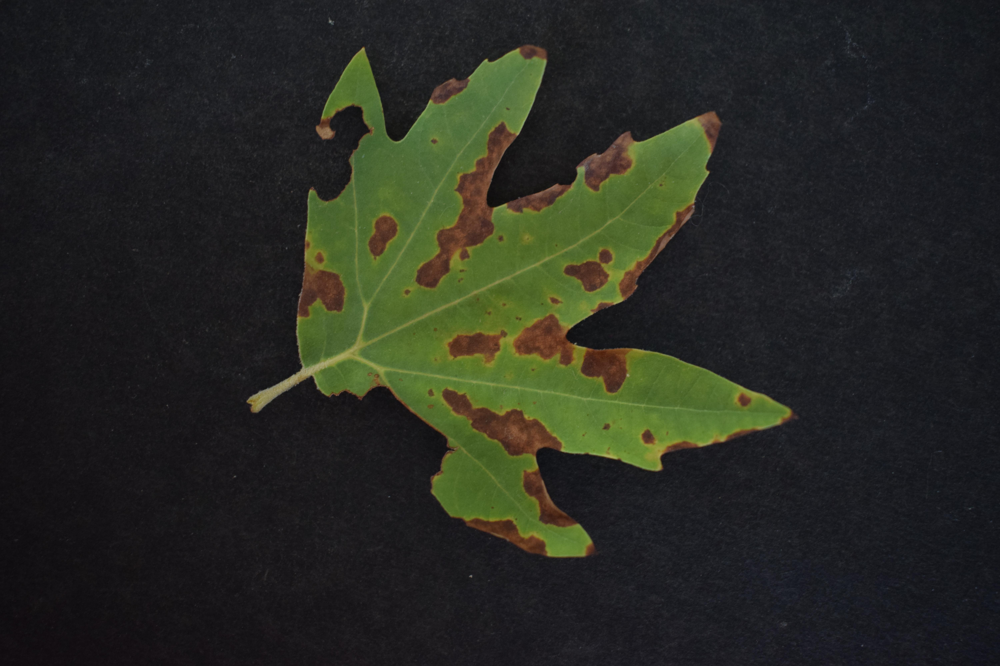

In [8]:
PIL.Image.open("/content/drive/MyDrive/YU-ML-Proj-1/CSML-1020/Group_Project/CNN-Araf/image_validate/0022_0089.JPG")

In [9]:
batch_size = 32
img_height = 180
img_width = 180

In [10]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1258 files belonging to 2 classes.
Using 1007 files for training.


In [11]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1258 files belonging to 2 classes.
Using 251 files for validation.


In [12]:
class_names = train_ds.class_names
print(class_names)

['diseased', 'healthy']


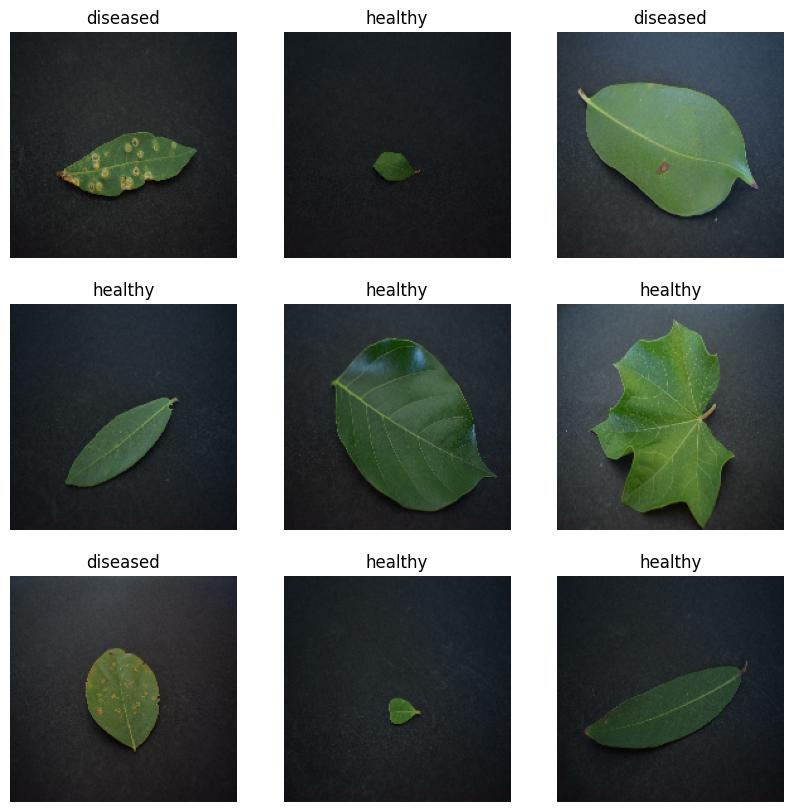

In [13]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [14]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


In [15]:
normalization_layer = tf.keras.layers.Rescaling(1./255)

In [16]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 0.5418651


In [17]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [18]:
num_classes = 2

model = tf.keras.Sequential([
  tf.keras.layers.Rescaling(1./255),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Dropout(0.4),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(num_classes, activation='softmax')
])

In [19]:
model.compile(
  optimizer='adam',
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

In [20]:
history=model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=20
)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5727: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


32/32 [==============================] - 259s 7s/step - loss: 0.8815 - accuracy: 0.5094 - val_loss: 0.6948 - val_accuracy: 0.4582
Epoch 2/20
32/32 [==============================] - 46s 1s/step - loss: 0.6867 - accuracy: 0.5362 - val_loss: 0.7004 - val_accuracy: 0.4582
Epoch 3/20
32/32 [==============================] - 46s 1s/step - loss: 0.6671 - accuracy: 0.6018 - val_loss: 0.7428 - val_accuracy: 0.4622
Epoch 4/20
32/32 [==============================] - 50s 2s/step - loss: 0.6336 - accuracy: 0.6276 - val_loss: 0.8720 - val_accuracy: 0.4661
Epoch 5/20
32/32 [==============================] - 47s 1s/step - loss: 0.6299 - accuracy: 0.6296 - val_loss: 0.7663 - val_accuracy: 0.5139
Epoch 6/20
32/32 [==============================] - 49s 2s/step - loss: 0.5465 - accuracy: 0.7170 - val_loss: 0.7491 - val_accuracy: 0.5817
Epoch 7/20
32/32 [==============================] - 47s 1s/step - loss: 0.5079 - accuracy: 0.7418 - val_loss: 0.6386 - val_accuracy: 0.6215
Epoch 8/20
32/32 [============

In [21]:
# using this version as predict_image is returning an array of values
from tensorflow.keras.preprocessing import image
import numpy as np

def predict_image(img_path):
    img = image.load_img(img_path, target_size=(180, 180))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    prediction = model.predict(img_array)
    index_pos=np.argmax(prediction);
    predicted_label=class_names[index_pos]
    #print("The sum of prediction probability is ", np.sum(prediction), " .The max probability is ", np.max(prediction), ".The index position of the corresponding label is ", np.argmax(prediction), "and the predicted label for this image is ", predicted_label)
    print("The max probability is ", np.max(prediction), "The index position of the corresponding label with max probability is ", np.argmax(prediction), "and the predicted label for this image is ", predicted_label)
    #print("Diseased prediction probability is ", prediction[0][0], "Healthy Prediction Probability is ", prediction[0][1])
    # Assuming the model outputs probabilities for multiple classes,
    # select the probability of the 'Diseased' class (adjust index as needed)
    #return 'Prediction for the given leaf image is - diseased' if prediction[0][0] > 0.5 else 'Prediction for the given leaf image is - healthy' # Access the probability of the first class
    return 'diseased' if prediction[0][0] > 0.5 else 'healthy' # Access the probability of the first class

In [22]:
print(predict_image(image_path_validation))

1/1 [==============================] - 0s 169ms/step
The max probability is  0.9949768 The index position of the corresponding label with max probability is  0 and the predicted label for this image is  diseased
diseased


**The predicted label/class of the images is available in a csv file**

In [23]:
image_paths = []
image_prediction = []
for images in os.listdir(BASE_DIR):
            image_paths.append(f"{BASE_DIR}/{images}")
#print(image_paths)


for images1 in image_paths:
  print (images1)
  label=predict_image(images1)
  image_prediction.append(label)

/content/drive/MyDrive/YU-ML-Proj-1/CSML-1020/Group_Project/CNN-Araf/image_validate//0022_0003.JPG
1/1 [==============================] - 0s 43ms/step
The max probability is  0.96864533 The index position of the corresponding label with max probability is  0 and the predicted label for this image is  diseased
/content/drive/MyDrive/YU-ML-Proj-1/CSML-1020/Group_Project/CNN-Araf/image_validate//0022_0089.JPG
1/1 [==============================] - 0s 34ms/step
The max probability is  0.9949768 The index position of the corresponding label with max probability is  0 and the predicted label for this image is  diseased
/content/drive/MyDrive/YU-ML-Proj-1/CSML-1020/Group_Project/CNN-Araf/image_validate//0012_0001.JPG
1/1 [==============================] - 0s 41ms/step
The max probability is  0.99989605 The index position of the corresponding label with max probability is  1 and the predicted label for this image is  healthy
/content/drive/MyDrive/YU-ML-Proj-1/CSML-1020/Group_Project/CNN-Araf/

In [24]:
import pandas as pd
pd.DataFrame({"Imagepath": image_paths, "Label": image_prediction}).to_csv(prediction_fname, index=False, header=True)



dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


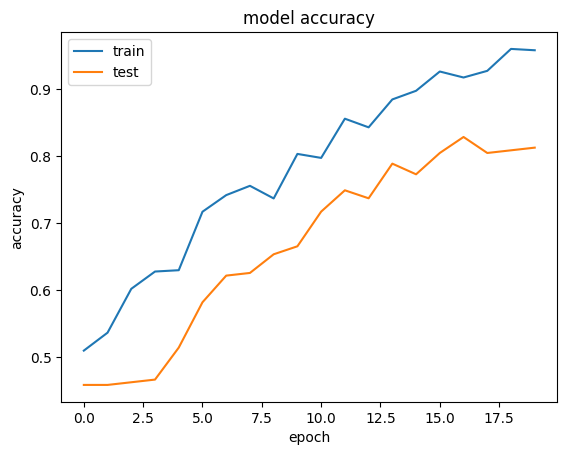

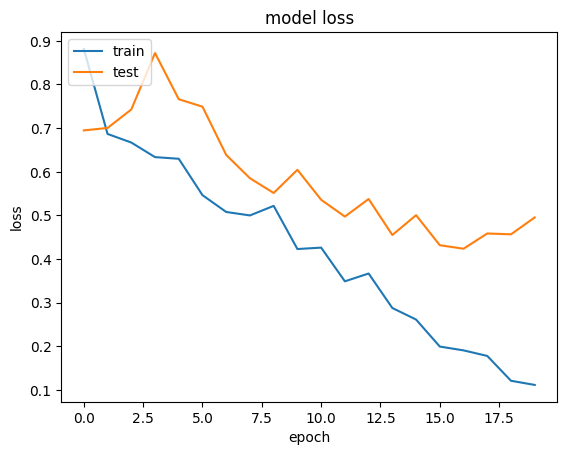

In [25]:
# plot learning curves

print("\n")
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()